In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import feature_extraction, linear_model, model_selection, preprocessing
import seaborn as sns
from nltk.corpus import stopwords
import nltk
nltk.download('stopwords')
stop=set(stopwords.words('english'))
from nltk.tokenize import word_tokenize
from nltk.util import ngrams
import string
from collections import defaultdict
import re
from tqdm import tqdm_notebook
nltk.download('punkt')
import torch
import torch.nn as nn
import torch.optim as optim
device_gpu = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
from IPython.display import clear_output
import torch.nn.functional as F
from sklearn.model_selection import train_test_split


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [2]:
train_df=pd.read_csv("/content/drive/My Drive/Citispotter/train.csv")
test_df=pd.read_csv("/content/drive/My Drive/Citispotter/test.csv")

In [ ]:
tea

In [ ]:
df_train=train_df.copy()
df_test=test_df.copy()

In [ ]:
# Data missing information for train
data_info=pd.DataFrame(train_df.dtypes).T.rename(index={0:'column type'})
data_info=data_info.append(pd.DataFrame(train_df.isnull().sum()).T.rename(index={0:'null values (nb)'}))
data_info=data_info.append(pd.DataFrame(train_df.isnull().sum()/train_df.shape[0]*100).T.
                         rename(index={0:'null values (%)'}))
display(data_info)

,text,sentiment
column type,object,object
null values (nb),1,0
null values (%),0.00284892,0


In [ ]:
# Dropping single null value in train data set
train_df.dropna(inplace=True)
test_df.dropna(inplace=True)
df_train.dropna(inplace=True)
df_test.dropna(inplace=True)


In [ ]:
train_df.head()

,text,sentiment
0,I LOVE @Health4UandPets u guys r the best!!,positive
1,im meeting up with one of my besties tonight! ...,positive
2,"Thanks for the Twitter add, Sunisa! I got to ...",positive
3,Being sick can be really cheap when it hurts t...,positive
4,he has that effect on everyone,positive


In [ ]:
train_df['word_count'] = train_df['text'].apply(lambda x: len(str(x).split()))
test_df['word_count'] = test_df['text'].apply(lambda x: len(str(x).split()))
train_df.head()

,text,sentiment,word_count
0,I LOVE @Health4UandPets u guys r the best!!,positive,8
1,im meeting up with one of my besties tonight! ...,positive,14
2,"Thanks for the Twitter add, Sunisa! I got to ...",positive,26
3,Being sick can be really cheap when it hurts t...,positive,21
4,he has that effect on everyone,positive,6


In [ ]:
#train_df['word_count'] = train_df['text'].apply(lambda x: len(str(x).split()))
test_df['word_count'] = test_df['text'].apply(lambda x: len(str(x).split()))
test_df.head()

,textID,text,sentiment,word_count
0,f87dea47db,Last session of the day http://twitpic.com/67ezh,neutral,6
1,96d74cb729,Shanghai is also really exciting (precisely -...,positive,15
2,eee518ae67,"Recession hit Veronique Branquinho, she has to...",negative,13
3,01082688c6,happy bday!,positive,2
4,33987a8ee5,http://twitpic.com/4w75p - I like it!!,positive,5


In [ ]:
count=0
for i in range(test_df.shape[0]):
  if test_df["word_count"].values[i]>31:
    count=count+1
print(count)

3


In [ ]:
df_test.head()

,textID,text,sentiment
0,f87dea47db,Last session of the day http://twitpic.com/67ezh,neutral
1,96d74cb729,Shanghai is also really exciting (precisely -...,positive
2,eee518ae67,"Recession hit Veronique Branquinho, she has to...",negative
3,01082688c6,happy bday!,positive
4,33987a8ee5,http://twitpic.com/4w75p - I like it!!,positive


In [ ]:
count=0
for i in range(train_df.shape[0]):
  if train_df["word_count"].values[i]>31:
    count=count+1
print(count)

9


In [ ]:
def generate_ngrams(text, n_gram=1):
    token = [token for token in text.lower().split(' ') if token != '' if token not in stop]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [' '.join(ngram) for ngram in ngrams]

N = 50

# Unigrams
positive_unigrams = defaultdict(int)
negative_unigrams = defaultdict(int)
neutral_unigrams = defaultdict(int)

for tweet in df_train[df_train.sentiment=="positive"]['text']:
    for word in generate_ngrams(tweet):
        positive_unigrams[word] += 1
        
for tweet in df_train[df_train.sentiment=="negative"]['text']:
    for word in generate_ngrams(tweet):
        negative_unigrams[word] += 1

for tweet in df_train[df_train.sentiment=="neutral"]['text']:
    for word in generate_ngrams(tweet):
        neutral_unigrams[word] += 1
        
df_positive_unigrams = pd.DataFrame(sorted(positive_unigrams.items(), key=lambda x: x[1])[::-1])
df_negative_unigrams = pd.DataFrame(sorted(negative_unigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_unigrams = pd.DataFrame(sorted(neutral_unigrams.items(), key=lambda x: x[1])[::-1])


# Bigrams
positive_bigrams = defaultdict(int)
negative_bigrams = defaultdict(int)
neutral_bigrams = defaultdict(int)

for tweet in df_train[df_train.sentiment=="positive"]['text']:
    for word in generate_ngrams(tweet,n_gram=2):
        positive_bigrams[word] += 1
        
for tweet in df_train[df_train.sentiment=="negative"]['text']:
    for word in generate_ngrams(tweet,n_gram=2):
        negative_bigrams[word] += 1

for tweet in df_train[df_train.sentiment=="neutral"]['text']:
    for word in generate_ngrams(tweet,n_gram=2):
        neutral_bigrams[word] += 1
        
df_positive_bigrams = pd.DataFrame(sorted(positive_bigrams.items(), key=lambda x: x[1])[::-1])
df_negative_bigrams = pd.DataFrame(sorted(negative_bigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_bigrams = pd.DataFrame(sorted(neutral_bigrams.items(), key=lambda x: x[1])[::-1])


# Trigrams
positive_trigrams = defaultdict(int)
negative_trigrams = defaultdict(int)
neutral_trigrams = defaultdict(int)

for tweet in df_train[df_train.sentiment=="positive"]['text']:
    for word in generate_ngrams(tweet,n_gram=3):
        positive_trigrams[word] += 1
        
for tweet in df_train[df_train.sentiment=="negative"]['text']:
    for word in generate_ngrams(tweet,n_gram=3):
        negative_trigrams[word] += 1

for tweet in df_train[df_train.sentiment=="neutral"]['text']:
    for word in generate_ngrams(tweet,n_gram=3):
        neutral_trigrams[word] += 1
        
df_positive_trigrams = pd.DataFrame(sorted(positive_trigrams.items(), key=lambda x: x[1])[::-1])
df_negative_trigrams = pd.DataFrame(sorted(negative_trigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_trigrams = pd.DataFrame(sorted(neutral_trigrams.items(), key=lambda x: x[1])[::-1])



/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 137 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 137 missing from current font.
  font.set_text(s, 0, flags=flags)


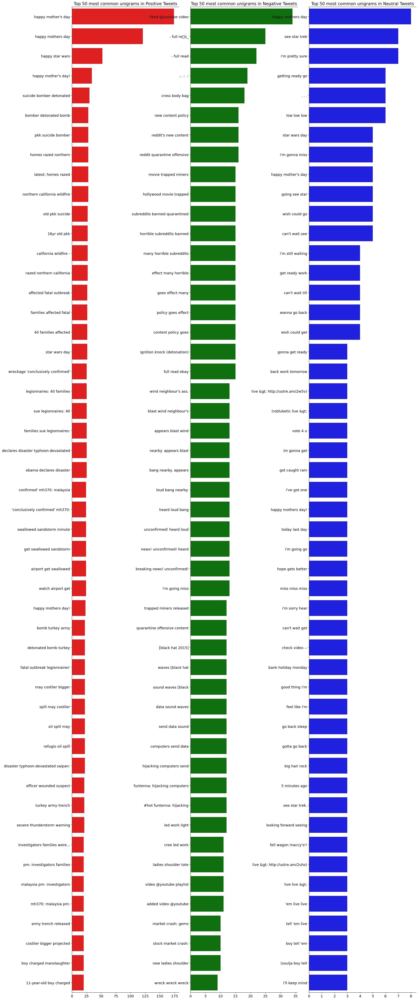

In [ ]:
fig, axes = plt.subplots(ncols=3, figsize=(18, 50), dpi=100)
plt.tight_layout()

sns.barplot(y=df_positive_trigrams[0].values[:N], x=df_positive_trigrams[1].values[:N], ax=axes[0], color='red')
sns.barplot(y=df_negative_trigrams[0].values[:N], x=df_negative_trigrams[1].values[:N], ax=axes[1], color='green')
sns.barplot(y=df_neutral_trigrams[0].values[:N], x=df_neutral_trigrams[1].values[:N], ax=axes[2], color='blue')


for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=13)
    axes[i].tick_params(axis='y', labelsize=13)

axes[0].set_title(f'Top {N} most common unigrams in Positive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common unigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common unigrams in Neutral Tweets', fontsize=15)

plt.show()

In [ ]:
string=r"#$%&'!()*+,-.:;<=>?@[\]^_\"`{|}~"
print(string)

#$%&'!()*+,-.:;<=>?@[\]^_\"`{|}~


In [ ]:
df_train["text"]=df_train["text"].apply(str)

In [ ]:
df_test["text"]=df_test["text"].apply(str)

In [ ]:
df_train['text']=df_train['text'].apply(lambda x : x.lower())

In [ ]:
df_test['text']=df_test['text'].apply(lambda x : x.lower())

In [ ]:
# Removing any URL
def remove_URL(text):
    #url = re.compile(r'https?://\S+|www\.\S+')
    #return url.sub(r'',text)
    #return re.sub(r"https?:\/\/t.co\/[A-Za-z0-9]+http:", "", text)
    return re.sub(r"https?://\S+|www\.\S+", "", text)
    #return re.sub(r'^https?:\/\/.*[\r\n]*', '', text, flags=re.MULTILINE)
    #return re.sub(r'''(?i)\b((?:https?://|www\d{0,3}[.]|[a-z0-9.\-]+[.][a-z]{2,4}/)(?:[^\s()<>]+|\(([^\s()<>]+|(\([^\s()<>]+\)))*\))+(?:\(([^\s()<>]+|(\([^\s()<>]+\)))*\)|[^\s`!()\[\]{};:'".,<>?«»“”‘’]))''', " ", text)
df_train['text']=df_train['text'].apply(lambda x : remove_URL(x))

In [ ]:
# Removing any URL
def remove_URL(text):
    
    return re.sub(r"https?://\S+|www\.\S+", "", text)
    
df_test['text']=df_test['text'].apply(lambda x : remove_URL(x))

In [ ]:
def remove_html(text):
    html=re.compile(r'<.*?>')
    return html.sub(r'',text)
df_train['text']=df_train['text'].apply(lambda x : remove_html(x))

In [ ]:
def remove_html(text):
    html=re.compile(r'<.*?>')
    return html.sub(r'',text)
df_test['text']=df_test['text'].apply(lambda x : remove_html(x))

In [ ]:
def remove_punct(text):
    table=str.maketrans('\t',' ',string)
    return text.translate(table)
df_train['text']=df_train['text'].apply(lambda x : remove_punct(x))

In [ ]:
def remove_punct(text):
    table=str.maketrans('\t',' ',string)
    return text.translate(table)
df_test['text']=df_test['text'].apply(lambda x : remove_punct(x))

In [ ]:
df_train.head()

,text,sentiment
0,i love health4uandpets u guys r the best,positive
1,im meeting up with one of my besties tonight c...,positive
2,thanks for the twitter add sunisa i got to me...,positive
3,being sick can be really cheap when it hurts t...,positive
4,he has that effect on everyone,positive


In [ ]:
import re
def fix_Plan(location):
    letters_only = re.sub("[^a-zA-Z]",  # Search for all non-letters
                          " ",          # Replace all non-letters with spaces
                          str(location))     # Column and row to search    

    words = letters_only.lower().split()     
    stops = set(stopwords.words("english"))      
    meaningful_words = [w for w in words]      
    return (" ".join(meaningful_words))    

#col_Plan = fix_Plan(df["text"][0])    
num_responses = df_train["text"].size    
clean_Plan_responses = []

for i in range(0,num_responses):
    clean_Plan_responses.append(fix_Plan(df_train["text"].values[i]))
    

In [ ]:
import re
def fix_Plan(location):
    letters_only = re.sub("[^a-zA-Z]",  # Search for all non-letters
                          " ",          # Replace all non-letters with spaces
                          str(location))     # Column and row to search    

    words = letters_only.lower().split()     
    stops = set(stopwords.words("english"))      
    meaningful_words = [w for w in words]      
    return (" ".join(meaningful_words))    

#col_Plan = fix_Plan(df["text"][0])    
num_responses = df_test["text"].size    
clean_Plan_responses = []

for i in range(0,num_responses):
    clean_Plan_responses.append(fix_Plan(df_test["text"].values[i]))
    

In [ ]:
text=[]
for i in range(len(clean_Plan_responses)):
  result = re.sub(r"^\s+", "", clean_Plan_responses[i])
  text.append(re.sub(r"\s+$", "", result))
#print(text)

In [ ]:
text=[]
for i in range(len(clean_Plan_responses)):
  result = re.sub(r"^\s+", "", clean_Plan_responses[i])
  text.append(re.sub(r"\s+$", "", result))
#print(text)

In [ ]:
text

['last session of the day',
 'shanghai is also really exciting precisely skyscrapers galore good tweeps in china sh bj',
 'recession hit veronique branquinho she has to quit her company such a shame',
 'happy bday',
 'i like it',
 'thats great weee visitors',
 'i think everyone hates me on here lol',
 'soooooo wish i could but im in school and myspace is completely blocked',
 'and within a short time of the last clue all of them',
 'what did you get my day is alright havent done anything yet leaving soon to my stepsister though',
 'my bike was put on holdshould have known that argh total bummer',
 'i checked we didnt win',
 'and youre on twitter did the tavern bore you that much',
 'im in va for the weekend my youngest son turns tomorrowit makes me kinda sad he is getting so big check out my twipics',
 'its coming out the socket i feel like my phones hole is not a virgin thats how loose it is',
 'so hot today dont like it and i hate my new timetable having such a bad week',
 'miss you'

In [ ]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name == '/device:GPU:0':
 print('Found GPU at: {}'.format(device_name))
else:
 raise SystemError('GPU device not found')

Found GPU at: /device:GPU:0


In [ ]:
import torch
if torch.cuda.is_available():   
 device = torch.device("cuda") 
 print('There are %d GPU(s) available.' % torch.cuda.device_count()) 
 print('We will use the GPU:', torch.cuda.get_device_name(0))
else:
 print('No GPU available, using the CPU instead.')
 device = torch.device("cpu")


There are 1 GPU(s) available.
We will use the GPU: Tesla T4


In [ ]:
!pip install transformers
!pip install wget
import wget
import os

     |████████████████████████████████| 1.3MB 19.9MB/s 
     |████████████████████████████████| 1.1MB 53.1MB/s 
     |████████████████████████████████| 2.9MB 59.2MB/s 
     |████████████████████████████████| 890kB 39.1MB/s 
  Created wheel for sacremoses: filename=sacremoses-0.0.43-cp36-none-any.whl size=893257 sha256=a00cb3cb1b0ea060be7cda55f8162d613bfb6a7b3be2aa94827f6f22481702f7
  Stored in directory: /root/.cache/pip/wheels/29/3c/fd/7ce5c3f0666dab31a50123635e6fb5e19ceb42ce38d4e58f45
Successfully built sacremoses
  Created wheel for wget: filename=wget-3.2-cp36-none-any.whl size=9682 sha256=720dd072b4d3724c218412efc1de77920f0076063342aca5d43340effe28f3f5
  Stored in directory: /root/.cache/pip/wheels/40/15/30/7d8f7cea2902b4db79e3fea550d7d7b85ecb27ef992b618f3f
Successfully built wget


In [ ]:
for i in range(df_train.shape[0]):
  if df_train["sentiment"].values[i]=="neutral":
    df_train["sentiment"].values[i]=0
  if df_train["sentiment"].values[i]=="positive":
    df_train["sentiment"].values[i]=1
  if df_train["sentiment"].values[i]=="negative":
    df_train["sentiment"].values[i]=2
# Get the lists of sentences and their labels.
#print(type(df["sentiment"].values))
sentences = df_train.text.values
labels = df_train.sentiment.values
#labels

In [ ]:
for i in range(df_test.shape[0]):
  if df_test["sentiment"].values[i]=="neutral":
    df_test["sentiment"].values[i]=0
  if df_test["sentiment"].values[i]=="positive":
    df_test["sentiment"].values[i]=1
  if df_test["sentiment"].values[i]=="negative":
    df_test["sentiment"].values[i]=2
# Get the lists of sentences and their labels.
#print(type(df["sentiment"].values)
labels = df_test.sentiment.values
#labels

In [ ]:
labels=labels.astype('float16')
type(labels)
#labels=torch.tensor(labels)

numpy.ndarray

In [ ]:
from transformers import BertTokenizer# Load the BERT tokenizer.
print('Loading BERT tokenizer...')
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased', do_lower_case=True)

Loading BERT tokenizer...


In [ ]:
# Tokenize all of the sentences and map the tokens to thier word IDs.
input_ids = []# For every sentence...
for sent in text:
 encoded_sent = tokenizer.encode(sent,add_special_tokens = True)
 
 # Add the encoded sentence to the list.
 input_ids.append(encoded_sent)

In [ ]:
len(text)

3534

In [ ]:
print('Max sentence length: ', max([len(sen) for sen in input_ids]))

Max sentence length:  50


In [ ]:
from keras.preprocessing.sequence import pad_sequences
MAX_LEN = 32
print('\nPadding/truncating all sentences to %d values...' % MAX_LEN)
print('\nPadding token: "{:}", ID: {:}'.format(tokenizer.pad_token, tokenizer.pad_token_id))
input_ids = pad_sequences(input_ids, maxlen=MAX_LEN, dtype="long", 
 value=0, truncating="post", padding="post")
print('\Done.')


Padding/truncating all sentences to 32 values...

Padding token: "[PAD]", ID: 0
\Done.


In [ ]:
input_ids[0]

array([ 101, 2197, 5219, 1997, 1996, 2154,  102,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0])

In [ ]:
attention_masks = []
for sent in input_ids:
  att_mask = [int(token_id > 0) for token_id in sent]
  attention_masks.append(att_mask)

In [ ]:
validation_inputs = torch.tensor(input_ids)
validation_labels = torch.tensor(labels)
validation_masks = torch.tensor(attention_masks)

In [ ]:
from sklearn.model_selection import train_test_split
train_inputs, validation_inputs, train_labels, validation_labels = train_test_split(input_ids, labels,random_state=2018, test_size=0.1)

train_masks, validation_masks, _, _ = train_test_split(attention_masks, labels,random_state=2018, test_size=0.1)

In [ ]:
train_inputs = torch.tensor(train_inputs)
validation_inputs = torch.tensor(validation_inputs)
train_labels = torch.tensor(train_labels)
validation_labels = torch.tensor(validation_labels)
train_masks = torch.tensor(train_masks)
validation_masks = torch.tensor(validation_masks)


In [ ]:
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler 

batch_size = 32
train_data = TensorDataset(train_inputs, train_masks, train_labels)
train_sampler = RandomSampler(train_data)
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=batch_size)
validation_data = TensorDataset(validation_inputs, validation_masks, validation_labels)
validation_sampler = SequentialSampler(validation_data)
validation_dataloader = DataLoader(validation_data, sampler=validation_sampler, batch_size=validation_inputs.shape[0])


In [ ]:
validation_data = TensorDataset(validation_inputs, validation_masks, validation_labels)
validation_sampler = SequentialSampler(validation_data)
validation_dataloader = DataLoader(validation_data, sampler=validation_sampler, batch_size=validation_inputs.shape[0])

In [ ]:
import torch
from transformers import BertModel
import math
import torch.nn.functional as F

In [ ]:
from transformers import AdamW, BertConfig
from torch.autograd import Variable

In [ ]:
class BertForSequenceClassification(nn.Module):
  
    def __init__(self, num_labels=2):
        super(BertForSequenceClassification, self).__init__()
        self.num_labels = num_labels
        self.bert = BertModel.from_pretrained('bert-base-uncased')
        self.dropout = nn.Dropout(0.1)
        self.size = 768
        self.alpha = nn.Parameter(torch.ones(self.size))
        self.bias = nn.Parameter(torch.zeros(self.size))
        self.eps=1e-9
        self.h = 4
        self.first_layer=nn.Linear(768,32)
        self.q_linear = nn.Linear(32,32)
        self.v_linear = nn.Linear(32,32)
        self.k_linear = nn.Linear(32,32)
        #self.dropout = nn.Dropout(0.1)
        self.out = nn.Linear(32,32)
        self.classifier = nn.Linear(768, num_labels)
        
        nn.init.xavier_normal_(self.classifier.weight)
        nn.init.xavier_normal_(self.first_layer.weight)

    def forward(self, input_ids, token_type_ids=None, attention_mask=None, labels=None):
        _, pooled_output = self.bert(input_ids, token_type_ids, attention_mask)
        pooled_output = self.dropout(pooled_output)
        q=input_ids.float().to(device)
        v=input_ids.float().to(device)
        k=input_ids.float().to(device)
        bs = q.size(0)
        
        k = self.k_linear(k).view(bs, -1, self.h, 8)
        #print(k)
        q = self.q_linear(q).view(bs, -1, self.h, 8)
        v = self.v_linear(v).view(bs, -1, self.h, 8)
        
        k = k.transpose(1,2)
        q = q.transpose(1,2)
        v = v.transpose(1,2)
        scores= torch.matmul(q, k.transpose(-2, -1))/math.sqrt(8)
        scores = torch.matmul(scores, v)
        concat = scores.transpose(1,2).contiguous().view(bs, -1, 32)
        output = self.out(concat)
        #output=self.dropout(output)
        norm = self.alpha * (pooled_output - pooled_output.mean(dim=-1, keepdim=True))/(pooled_output.std(dim=-1, keepdim=True) + self.eps) + self.bias
        logits = self.classifier(norm)
        

        return logits

    def fit(self,sentences):
        #temp1=[]
        #temp1.append(sentences)
        #print(sentences,len(temp1))
        tokenizer = BertTokenizer.from_pretrained('bert-base-uncased', do_lower_case=True,max_length=512)
        
        val_ids = []# For every sentence...
        for sent in sentences:
        #print(sent)
          encoded_sent = tokenizer.encode(sentences,add_special_tokens = True)
          val_ids.append(encoded_sent)
        
        MAX_LEN = 32
        val_ids = pad_sequences(val_ids, maxlen=MAX_LEN, dtype="long",value=0, truncating="post", padding="post")
        #print(val_ids.shape)
        validation_masks = []
        for sent in val_ids:
          att_mask = [int(token_id > 0) for token_id in sent]
          validation_masks.append(att_mask)

        validation_inputs = torch.tensor(val_ids)
        #validation_labels = torch.tensor(validation_labels)
        validation_masks = torch.tensor(validation_masks)
        validation_data = TensorDataset(validation_inputs, validation_masks)
        validation_sampler = SequentialSampler(validation_data)
        
        validation_dataloader = DataLoader(validation_data, sampler=validation_sampler, batch_size=1)
        results=[]
        count=0
        for batch in validation_dataloader:
          count=count+1
          #print(batch)
          batch = tuple(t.to(device) for t in batch)
          b_ids, b_mask = batch
          #print(b_input_ids)
          with torch.no_grad():
            out = self.forward(b_ids,token_type_ids=None,attention_mask=b_mask)  
          logits_pred = out
          #logits_pred=F.softmax(logits_pred,dim=-1)
          
          logits_pred = logits_pred.detach().cpu().numpy()
          #print(logits)
          #pred_flat = np.argmax(logits.reshape(logits.shape[0],3), axis=1).flatten()
          #logits_confidence = logits[0][0][pred_flat]
          results.append(logits_pred)
        
        results=np.array(results)
        #print(count,len(sentences))
        
        temp=[]
        for i in range(len(sentences)):
          temp.append(results[i][0])
        results=np.array(temp)
        

        
        

        return results

In [ ]:
model=BertForSequenceClassification(3)
#model.to(torch.double)
model.cuda()


BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0): BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, element

In [ ]:
optimizer = AdamW(model.parameters(),
 lr = 2e-5, 
 eps = 1e-8 
 )
from transformers import get_linear_schedule_with_warmup
epochs =1000
total_steps = len(train_dataloader) * epochs
scheduler = get_linear_schedule_with_warmup(optimizer, 
 num_warmup_steps = 0,
 num_training_steps = total_steps)

In [ ]:
import numpy as np# Function to calculate the accuracy of our predictions vs labels
def flat_accuracy(preds, labels):
 #pred_flat=F.softmax(preds,dim=0)
 pred_flat = np.argmax(preds, axis=1).flatten()
 
 #labels_flat = np.argmax(labels,axis=1).flatten()
 labels_flat=labels.flatten()
 #print(pred_flat,labels_flat)
 return np.sum(pred_flat == labels_flat) / len(labels_flat)

In [ ]:
import time
import datetime
def format_time(elapsed):
 '''
 Takes a time in seconds and returns a string hh:mm:ss
 '''
 # Round to the nearest second.
 elapsed_rounded = int(round((elapsed)))

 # Format as hh:mm:ss
 return str(datetime.timedelta(seconds=elapsed_rounded))

In [ ]:
# Keep only a single checkpoint, the best over test accuracy.
def save_checkpoint(state, is_best, filename='/content/drive/My Drive/Citispotter/sentiment_checks_wp1/checkpoint_4.pth.tar'):
    """Save checkpoint if a new best is achieved"""
    if is_best:
        print ("=> Saving a new best")
        torch.save(state, filename)  # save checkpoint
    else:
        print ("=> Training Loss did not improve")

In [ ]:
resume_weights = '/content/drive/My Drive/Citispotter_my/sentiment_checks_wp1/checkpoint_4.pth.tar'

In [ ]:

import os.path


In [ ]:
# If exists a best model, load its weights!
if os.path.isfile(resume_weights):
    #print("=> loading checkpoint '{}' ...".format(resume_weights))
    if device:
        checkpoint = torch.load(resume_weights)
    else:
        # Load GPU model on CPU
        checkpoint = torch.load(resume_weights,
                                map_location=lambda storage,
                                loc: storage)
    start_epoch = checkpoint['epoch']
    best_accuracy = checkpoint['best_accuracy']
    model.load_state_dict(checkpoint['state_dict'])
    print("=> loaded checkpoint '{}' (trained for {} epochs)",checkpoint['epoch'],best_accuracy,start_epoch)

=> loaded checkpoint '{}' (trained for {} epochs) 66 tensor([0.0005]) 66


In [ ]:
loss_values = []

In [ ]:
import random
best_accuracy=torch.FloatTensor([0.0005])
seed_val = 42
random.seed(seed_val)
np.random.seed(seed_val)
torch.manual_seed(seed_val)
torch.cuda.manual_seed_all(seed_val)

for epoch_i in range(0, epochs):
 if epoch_i%1==0:
  print('======== Epoch {:} / {:} ========'.format(epoch_i + 1, epochs))
  print('Training...') 
 t0 = time.time() 
 total_loss = 0 
 model.train()
 
 criterion = nn.CrossEntropyLoss()
 
 for step, batch in enumerate(train_dataloader): 
  if step % 50 == 0 and not step == 0:

    elapsed = format_time(time.time() - t0)


    print(' Batch {:>5,} of {:>5,}. Elapsed: {:}.'.format(step, len(train_dataloader), elapsed)) # Unpack this training batch from our dataloader. 

  b_input_ids = batch[0].to(device)
  b_input_mask = batch[1].to(device)
  b_labels = batch[2].to(device) 
  model.zero_grad() 
  #print(b_labels.shape[0])
  outputs = model.forward(b_input_ids, token_type_ids=None, attention_mask=b_input_mask, labels=b_labels)
  #print(outputs.reshape(32,3).shape,b_labels.shape)
  loss=criterion(outputs.reshape(b_labels.shape[0],3),b_labels.long().to(device))
 #loss = outputs[0] 
 #print('outputs',outputs)
  #print(loss.item())
  total_loss += loss.item()/64 
  loss.backward(retain_graph=True)
  torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
  optimizer.step() 
  scheduler.step() 
 avg_train_loss = total_loss / len(train_dataloader) 
 print(avg_train_loss)
 #acc = calc_accuracy(net,device='cpu') * 100
 #print('=> Test set: Accuracy:',acc)
 acc = torch.FloatTensor([avg_train_loss])
 # Get bool not ByteTensor
 is_best = bool(acc.numpy() < best_accuracy.numpy())
 # Get greater Tensor to keep track best acc
 best_accuracy = torch.FloatTensor(min(acc.numpy(), best_accuracy.numpy()))
 save_checkpoint({
                'epoch': start_epoch + epoch_i + 1,
                'state_dict': model.state_dict(),
                'best_accuracy': best_accuracy
            }, is_best)
 loss_values.append(avg_train_loss)
 #print("")
 #print(" Average training loss: {0:.2f}".format(avg_train_loss))
 #print(" Training epcoh took: {:}".format(format_time(time.time() - t0)))



print("Training complete!")

In [ ]:
print("Running Validation...")
t0 = time.time()

model.eval() 
eval_loss, eval_accuracy = 0, 0
nb_eval_steps, nb_eval_examples = 0, 0
for batch in validation_dataloader:

 #print(batch)
 batch = tuple(t.to(device) for t in batch)

 
 b_input_ids, b_input_mask, b_labels = batch
 #print(b_input_ids)
 
 with torch.no_grad():  
  outputs = model(b_input_ids,token_type_ids=None,attention_mask=b_input_mask)  
  logits_val = outputs
  logits_val=F.softmax(logits_val,dim=-1)
  logits_val = logits_val.detach().cpu().numpy()
  label_ids = b_labels.to('cpu').numpy()
 #print(logits[0][0],label_ids)
 #print(logits.reshape(32,3))
  tmp_eval_accuracy = flat_accuracy(logits_val.reshape(logits_val.shape[0],3), label_ids)
 #print(tmp_eval_accuracy)
  pred_flat = np.argmax(logits_val.reshape(logits_val.shape[0],3), axis=1).flatten()
  labels_pred=label_ids.flatten()

  eval_accuracy += tmp_eval_accuracy 
  nb_eval_steps += 1 
  #print(" Accuracy: {0:.2f}".format(eval_accuracy/nb_eval_steps))
 #print(" Validation took: {:}".format(format_time(time.time() - t0)))
 #print(nb_eval_steps)
print(pred_flat,labels_pred)
print(np.sum(pred_flat == labels_pred) / len(labels_pred))

Running Validation...
[1 0 0 ... 2 2 2] [1. 0. 0. ... 2. 2. 2.]
0.9566951566951567


In [ ]:
import plotly.express as px
f = pd.DataFrame(loss_values)
f.columns=['Loss']
fig = px.line(f, x=f.index, y=f.Loss)
fig.update_layout(title='Training loss of the Model',
 xaxis_title='Epoch',
 yaxis_title='Loss')
fig.show()

In [ ]:
! pip install lime

     |████████████████████████████████| 276kB 12.0MB/s 
     |████████████████████████████████| 2.0MB 36.1MB/s 
  Created wheel for lime: filename=lime-0.2.0.0-cp36-none-any.whl size=284181 sha256=9d6b9c202c886a44a1429920156dfd9e89179c77d084754a246db20ef1ef10f5
  Stored in directory: /root/.cache/pip/wheels/22/f2/ec/e5ebd07348b2b1ac722e91c2f549fcc220f7d5f25497a61232
Successfully built lime
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Pillow 7.0.0
    Uninstalling Pillow-7.0.0:
      Successfully uninstalled Pillow-7.0.0


In [ ]:
from lime.lime_text import LimeTextExplainer
explainer = LimeTextExplainer(class_names=[0,1,2],bow=False)

In [ ]:
import json

string=r"#$%&'!()*+,-.:;<=>?@[\]^_\"`{|}~"
text = input().split(':')
text_df=pd.DataFrame()
text_df["text"]=text
print(text_df)
def remove_URL(text):
    return re.sub(r"https?://\S+|www\.\S+", "", text)

def remove_html(text):
    html=re.compile(r'<.*?>')
    return html.sub(r'',text)

def remove_punct(text):
    table=str.maketrans('\t',' ',string)
    return text.translate(table)


def fix_Plan(location):
    letters_only = re.sub("[^a-zA-Z]",  # Search for all non-letters
                          " ",          # Replace all non-letters with spaces
                          str(location))     # Column and row to search    

    words = letters_only.lower().split()     
    stops = set(stopwords.words("english"))      
    meaningful_words = [w for w in words]      
    return (" ".join(meaningful_words))

resume_weights = '/content/drive/My Drive/Citispotter/sentiment_checks_wp1/Train/checkpoint_4.pth.tar'
if os.path.isfile(resume_weights):
  if device:
    checkpoint = torch.load(resume_weights)
       
  start_epoch = checkpoint['epoch']
  best_accuracy = checkpoint['best_accuracy']
  model.load_state_dict(checkpoint['state_dict'])
print("=> loaded checkpoint '{}' (trained for {} epochs)",checkpoint['epoch'],best_accuracy,start_epoch)





text_df["text"]=text_df["text"].apply(str)
text_df["text"]=text_df["text"].apply(lambda x : x.lower())
text_df["text"]=text_df["text"].apply(lambda x : remove_URL(x))
text_df["text"]=text_df["text"].apply(lambda x : remove_html(x))
text_df["text"]=text_df["text"].apply(lambda x : remove_punct(x))
num_responses = text_df.shape[0]    
clean_Plan_responses = []

for i in range(0,num_responses):
    clean_Plan_responses.append(fix_Plan(text[i]))

text_predict=[]
for i in range(len(clean_Plan_responses)):
    result = re.sub(r"^\s+", "", clean_Plan_responses[i])
    text_predict.append(re.sub(r"\s+$", "", result))

input_ids = []
for sent in text_predict:
    encoded_sent = tokenizer.encode(sent,add_special_tokens = True)
    input_ids.append(encoded_sent)
MAX_LEN = 32
input_ids = pad_sequences(input_ids, maxlen=MAX_LEN, dtype="long",value=0, truncating="post", padding="post")
attention_masks = []
for sent in input_ids:
    att_mask = [int(token_id > 0) for token_id in sent]
    attention_masks.append(att_mask)

inputs = torch.tensor(input_ids)
masks = torch.tensor(attention_masks)
data = TensorDataset(inputs,masks)
sampler = SequentialSampler(data)
loader = DataLoader(data, sampler=sampler, batch_size=inputs.shape[0])
#print("aaa")
model.eval() 
for batch in loader:
    batch = tuple(t.to(device) for t in batch)
    b_input_ids, b_input_mask = batch
    with torch.no_grad():  
        outputs = model(b_input_ids,token_type_ids=None,attention_mask=b_input_mask)  
    logits_val = outputs
    logits_val=F.softmax(logits_val,dim=-1)
    logits_val = logits_val.detach().cpu().numpy()
    #label_ids = b_labels.to('cpu').numpy()
    pred_flat = np.argmax(logits_val.reshape(logits_val.shape[0],3), axis=1).flatten()
    pred_flat=list(pred_flat)
print(pred_flat[0])

for i in range(len(pred_flat)):
    if pred_flat[i]==0:
        pred_flat[i]="neutral"
    if pred_flat[i]==1:
        pred_flat[i]="positive"
    else:
        pred_flat[i]="negative"
print(pred_flat)
pred=json.dumps(pred_flat)
print(pred)



i am very happy
              text
0  i am very happy
=> loaded checkpoint '{}' (trained for {} epochs) 66 tensor([0.0005]) 66
1
['positive']
["positive"]


In [ ]:
from sklearn.metrics import multilabel_confusion_matrix

In [ ]:
cm=multilabel_confusion_matrix
a=cm(labels_pred,pred_flat,labels=[0,1,2])

In [ ]:
a

array([[[2301,   50],
        [  57, 1102]],

       [[2304,   26],
        [  67, 1113]],

       [[2263,   76],
        [  28, 1143]]])

In [ ]:
a_neutral=a[0]
a_positive=a[1]
a_negative=a[2]

In [ ]:
a_neutral

array([[2301,   50],
       [  57, 1102]])

In [ ]:
def evaluation(A):
  true_positive=A[1,1]
  true_negative=A[0,0]
  false_positive=A[1,0]
  false_negative=A[0,1]
  precision=true_positive/(true_positive+false_negative)
  recall=true_positive/(true_positive+false_positive)
  f1=2*precision*recall/(precision+recall)
  return precision,recall,f1

In [ ]:
neutral_eval=evaluation(a_neutral)
positive_eval=evaluation(a_positive)
negative_eval=evaluation(a_negative)
print(neutral_eval,positive_eval,negative_eval)

(0.9565972222222222, 0.9508196721311475, 0.9536996971008221) (0.9771729587357331, 0.9432203389830508, 0.9598965071151357) (0.9376538146021329, 0.9760888129803587, 0.9564853556485357)


In [ ]:
from sklearn.metrics import confusion_matrix
confusion_matrix(labels_pred,pred_flat)

array([[848, 111, 155],
       [160, 673,  19],
       [149,  26, 608]])

In [ ]:
'I am very happy and excited to start running from today. The most beautiful way to keep yourself healthy and fit is to run. One should enjoy the process of running so as to have a good mental and physical health' 

In [ ]:
model.fit(['i am going through a bad phase'])

array([[ 8.309418 , -3.4645412, -3.682786 ]], dtype=float32)

In [ ]:
def prediction(text):

  string=r"#$%&'!()*+,-.:;<=>?@[\]^_\"`{|}~"
  #text = input().split(':')
  text_df=pd.DataFrame()
  text_df["text"]=text
  print(text_df)
  def remove_URL(text):
      return re.sub(r"https?://\S+|www\.\S+", "", text)

  def remove_html(text):
      html=re.compile(r'<.*?>')
      return html.sub(r'',text)

  def remove_punct(text):
      table=str.maketrans('\t',' ',string)
      return text.translate(table)


  def fix_Plan(location):
      letters_only = re.sub("[^a-zA-Z]",  # Search for all non-letters
                            " ",          # Replace all non-letters with spaces
                            str(location))     # Column and row to search    

      words = letters_only.lower().split()     
      stops = set(stopwords.words("english"))      
      meaningful_words = [w for w in words]      
      return (" ".join(meaningful_words))

  resume_weights = '/content/drive/My Drive/Citispotter/sentiment_checks_wp1/Train/checkpoint_4.pth.tar'
  if os.path.isfile(resume_weights):
    if device:
      checkpoint = torch.load(resume_weights)
        
    start_epoch = checkpoint['epoch']
    best_accuracy = checkpoint['best_accuracy']
    model.load_state_dict(checkpoint['state_dict'])
  #print("=> loaded checkpoint '{}' (trained for {} epochs)",checkpoint['epoch'],best_accuracy,start_epoch)





  text_df["text"]=text_df["text"].apply(str)
  text_df["text"]=text_df["text"].apply(lambda x : x.lower())
  text_df["text"]=text_df["text"].apply(lambda x : remove_URL(x))
  text_df["text"]=text_df["text"].apply(lambda x : remove_html(x))
  text_df["text"]=text_df["text"].apply(lambda x : remove_punct(x))
  num_responses = text_df.shape[0]    
  clean_Plan_responses = []

  for i in range(0,num_responses):
      clean_Plan_responses.append(fix_Plan(text[i]))

  text_predict=[]
  for i in range(len(clean_Plan_responses)):
      result = re.sub(r"^\s+", "", clean_Plan_responses[i])
      text_predict.append(re.sub(r"\s+$", "", result))

  input_ids = []
  for sent in text_predict:
      encoded_sent = tokenizer.encode(sent,add_special_tokens = True,max_length=512)
      input_ids.append(encoded_sent)
  MAX_LEN = 32
  input_ids = pad_sequences(input_ids, maxlen=MAX_LEN, dtype="long",value=0, truncating="post", padding="post")
  attention_masks = []
  for sent in input_ids:
      att_mask = [int(token_id > 0) for token_id in sent]
      attention_masks.append(att_mask)

  inputs = torch.tensor(input_ids)
  masks = torch.tensor(attention_masks)
  data = TensorDataset(inputs,masks)
  sampler = SequentialSampler(data)
  loader = DataLoader(data, sampler=sampler, batch_size=inputs.shape[0])
  #print("aaa")
  results=[]
  model.eval() 
  for batch in loader:
      batch = tuple(t.to(device) for t in batch)
      b_input_ids, b_input_mask = batch
      with torch.no_grad():  
          outputs = model(b_input_ids,token_type_ids=None,attention_mask=b_input_mask)  
      logits_val = outputs
      logits_val=F.softmax(logits_val,dim=-1)
      logits_val = logits_val.detach().cpu().numpy()
    
      results.append(logits_val)
  results=np.array(results)
  print(results.shape)
  temp=[]
  for i in range(len(text)):
    temp.append(results[0][i])
  results=np.array(temp)
  
  return results



In [ ]:
a=prediction(["What I used to say to people, when I was much more engage myself, is that you can't be apolitical. It will come and get you. It's not that you shouldn't be neutral. It's that you won't be able to stay neutral",'i am very happy about the fact that taboo topics are being discussed openly which helps everyperson live the way they want to live but i feel very sad that people are still not understanding to respect each persons stance',"The pleasure of remembering had been taken from me, because there was no longer anyone to remember with. It felt like losing your co-rememberer meant losing the memory itself. As if the things we'd done were less real and important than they had been hours before","When someone you love dies, and you’re not expecting it, you don’t lose her all at once; you lose her in pieces over a long time — the way the mail stops coming, and her scent fades from the pillows and even from the clothes in her closet and drawers","You once told me that the human eye is god's loneliest creation. How so much of the world passes through the pupil and still it holds nothing. The eye, alone in its socket, doesn't even know there's another one, just like it, an inch away, just as hungry, as empty","My counselling client sat with tears in her eye. She shared her stories of feeling disrespected at work, taken for granted at home, and hearing a snide remark from a father-in-law. These may indeed have been realities but she exasperated them by her pessimistic viewpoint. She viewed her problems as permanent. “Why me?” she lamented. She wanted to desperately relieve her stress but didn’t see what she could change or control.","i am very happy to announce my wedding to the rest of the world. I feel that I am currently at the top of the world. I finally understand why people say that marriage is a bliss and I am optimistic about my married life","I am very happy and excited to start running from today. The most beautiful way to keep yourself healthy and fit is to run. One should enjoy the process of running so as to have a good mental and physical health","The idea of living in a world full of people excites me to the core of my heart. For me any interaction with any person is important as it brings joy to me. I just want everone to feel as comfortable as possible while talikng and that is why I am starting a class for people to make their personality more attractive","The most important aspect of beauty was, therefore, an inherent part of an object, rather than something applied superficially, and was based on universal, recognisable truths. The notion of style in the arts was not developed until the 16th century, with the writing of Vasari. By the 18th century, his Lives of the Most Excellent Painters, Sculptors, and Architects had been translated into Italian, French, Spanish, and English."])
b=np.argmax(a, axis=1).flatten()
b=list(b)
for i in range(len(b)):
  if b[i]==0:
    b[i]="neutral"
  if b[i]==1:
    b[i]="positive"
  if b[i]==2:
    b[i]="negative"
print(b)

                                                text
0  What I used to say to people, when I was much ...
1  i am very happy about the fact that taboo topi...
2  The pleasure of remembering had been taken fro...
3  When someone you love dies, and you’re not exp...
4  You once told me that the human eye is god's l...
5  My counselling client sat with tears in her ey...
6  i am very happy to announce my wedding to the ...
7  I am very happy and excited to start running f...
8  The idea of living in a world full of people e...
9  The most important aspect of beauty was, there...
(1, 10, 3)
['neutral', 'neutral', 'negative', 'negative', 'negative', 'negative', 'positive', 'positive', 'positive', 'negative']


In [ ]:
from lime.lime_text import LimeTextExplainer
explainer = LimeTextExplainer(class_names=[0,1,2],bow=False)

In [ ]:
my_list=["What I used to say to people, when I was much more engage myself, is that you can't be apolitical. It will come and get you. It's not that you shouldn't be neutral. It's that you won't be able to stay neutral",'i am very happy about the fact that taboo topics are being discussed openly which helps everyperson live the way they want to live but i feel very sad that people are still not understanding to respect each persons stance',"The pleasure of remembering had been taken from me, because there was no longer anyone to remember with. It felt like losing your co-rememberer meant losing the memory itself. As if the things we'd done were less real and important than they had been hours before","When someone you love dies, and you’re not expecting it, you don’t lose her all at once; you lose her in pieces over a long time — the way the mail stops coming, and her scent fades from the pillows and even from the clothes in her closet and drawers","You once told me that the human eye is god's loneliest creation. How so much of the world passes through the pupil and still it holds nothing. The eye, alone in its socket, doesn't even know there's another one, just like it, an inch away, just as hungry, as empty","My counselling client sat with tears in her eye. She shared her stories of feeling disrespected at work, taken for granted at home, and hearing a snide remark from a father-in-law. These may indeed have been realities but she exasperated them by her pessimistic viewpoint. She viewed her problems as permanent. “Why me?” she lamented. She wanted to desperately relieve her stress but didn’t see what she could change or control.","i am very happy to announce my wedding to the rest of the world. I feel that I am currently at the top of the world. I finally understand why people say that marriage is a bliss and I am optimistic about my married life","I am very happy and excited to start running from today. The most beautiful way to keep yourself healthy and fit is to run. One should enjoy the process of running so as to have a good mental and physical health","The idea of living in a world full of people excites me to the core of my heart. For me any interaction with any person is important as it brings joy to me. I just want everone to feel as comfortable as possible while talikng and that is why I am starting a class for people to make their personality more attractive","The most important aspect of beauty was, therefore, an inherent part of an object, rather than something applied superficially, and was based on universal, recognisable truths. The notion of style in the arts was not developed until the 16th century, with the writing of Vasari. By the 18th century, his Lives of the Most Excellent Painters, Sculptors, and Architects had been translated into Italian, French, Spanish, and English."]
for text in my_list:
  print(text)
  exp = explainer.explain_instance(text, prediction,num_samples=500)
  exp.show_in_notebook(text=True)
  #exp.as_list()

What I used to say to people, when I was much more engage myself, is that you can't be apolitical. It will come and get you. It's not that you shouldn't be neutral. It's that you won't be able to stay neutral
                                                  text
0    What I used to say to people, when I was much ...
1    UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ t...
2    What I UNKWORDZ to UNKWORDZ to people, when I ...
3    What UNKWORDZ UNKWORDZ UNKWORDZ say to people,...
4    What I used to say to people, when I was much ...
..                                                 ...
495  What I UNKWORDZ to say to people, UNKWORDZ UNK...
496  UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ say UNKWOR...
497  What I UNKWORDZ UNKWORDZ say UNKWORDZ UNKWORDZ...
498  What I used to UNKWORDZ to people, when I was ...
499  What UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ UNKWO...

[500 rows x 1 columns]


/usr/local/lib/python3.6/dist-packages/lime/lime_text.py:114: FutureWarning: split() requires a non-empty pattern match.
  self.as_list = [s for s in splitter.split(self.raw) if s]


(1, 500, 3)


i am very happy about the fact that taboo topics are being discussed openly which helps everyperson live the way they want to live but i feel very sad that people are still not understanding to respect each persons stance
                                                  text
0    i am very happy about the fact that taboo topi...
1    UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ U...
2    UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ U...
3    UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ U...
4    UNKWORDZ UNKWORDZ UNKWORDZ happy UNKWORDZ UNKW...
..                                                 ...
495  i am UNKWORDZ UNKWORDZ about the fact UNKWORDZ...
496  i UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ...
497  UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ U...
498  UNKWORDZ am very happy about the fact that tab...
499  i am very happy UNKWORDZ the fact that taboo U...

[500 rows x 1 columns]


/usr/local/lib/python3.6/dist-packages/lime/lime_text.py:114: FutureWarning: split() requires a non-empty pattern match.
  self.as_list = [s for s in splitter.split(self.raw) if s]


(1, 500, 3)


The pleasure of remembering had been taken from me, because there was no longer anyone to remember with. It felt like losing your co-rememberer meant losing the memory itself. As if the things we'd done were less real and important than they had been hours before
                                                  text
0    The pleasure of remembering had been taken fro...
1    The UNKWORDZ of remembering had been taken fro...
2    UNKWORDZ pleasure UNKWORDZ UNKWORDZ UNKWORDZ U...
3    UNKWORDZ pleasure UNKWORDZ UNKWORDZ UNKWORDZ U...
4    UNKWORDZ UNKWORDZ of UNKWORDZ UNKWORDZ UNKWORD...
..                                                 ...
495  The pleasure of remembering had been taken fro...
496  The pleasure of remembering had been taken fro...
497  The pleasure of remembering had been taken fro...
498  UNKWORDZ pleasure UNKWORDZ UNKWORDZ UNKWORDZ b...
499  The pleasure UNKWORDZ remembering UNKWORDZ bee...

[500 rows x 1 columns]


/usr/local/lib/python3.6/dist-packages/lime/lime_text.py:114: FutureWarning: split() requires a non-empty pattern match.
  self.as_list = [s for s in splitter.split(self.raw) if s]


(1, 500, 3)


When someone you love dies, and you’re not expecting it, you don’t lose her all at once; you lose her in pieces over a long time — the way the mail stops coming, and her scent fades from the pillows and even from the clothes in her closet and drawers
                                                  text
0    When someone you love dies, and you’re not exp...
1    When UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ, UNKW...
2    When someone you love dies, and you’re not exp...
3    UNKWORDZ UNKWORDZ UNKWORDZ love UNKWORDZ, UNKW...
4    When someone UNKWORDZ UNKWORDZ UNKWORDZ, UNKWO...
..                                                 ...
495  When someone you love dies, and you’re not exp...
496  UNKWORDZ someone you love dies, and you’UNKWOR...
497  UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ, ...
498  When UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ, UNKW...
499  When someone UNKWORDZ love dies, and you’re no...

[500 rows x 1 columns]


/usr/local/lib/python3.6/dist-packages/lime/lime_text.py:114: FutureWarning: split() requires a non-empty pattern match.
  self.as_list = [s for s in splitter.split(self.raw) if s]


(1, 500, 3)


You once told me that the human eye is god's loneliest creation. How so much of the world passes through the pupil and still it holds nothing. The eye, alone in its socket, doesn't even know there's another one, just like it, an inch away, just as hungry, as empty
                                                  text
0    You once told me that the human eye is god's l...
1    UNKWORDZ UNKWORDZ told me that the UNKWORDZ UN...
2    You once told me that the human eye is god's l...
3    You once told me that the UNKWORDZ eye is god'...
4    UNKWORDZ UNKWORDZ UNKWORDZ me UNKWORDZ UNKWORD...
..                                                 ...
495  You UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ UNKWOR...
496  UNKWORDZ once UNKWORDZ UNKWORDZ that UNKWORDZ ...
497  You UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ UNKWOR...
498  UNKWORDZ once told UNKWORDZ that the human UNK...
499  UNKWORDZ UNKWORDZ UNKWORDZ me that the UNKWORD...

[500 rows x 1 columns]


/usr/local/lib/python3.6/dist-packages/lime/lime_text.py:114: FutureWarning: split() requires a non-empty pattern match.
  self.as_list = [s for s in splitter.split(self.raw) if s]


(1, 500, 3)


My counselling client sat with tears in her eye. She shared her stories of feeling disrespected at work, taken for granted at home, and hearing a snide remark from a father-in-law. These may indeed have been realities but she exasperated them by her pessimistic viewpoint. She viewed her problems as permanent. “Why me?” she lamented. She wanted to desperately relieve her stress but didn’t see what she could change or control.
                                                  text
0    My counselling client sat with tears in her ey...
1    My counselling UNKWORDZ sat with tears in her ...
2    My UNKWORDZ UNKWORDZ UNKWORDZ with UNKWORDZ UN...
3    UNKWORDZ counselling UNKWORDZ UNKWORDZ UNKWORD...
4    My UNKWORDZ UNKWORDZ sat UNKWORDZ tears in her...
..                                                 ...
495  My counselling client sat with UNKWORDZ in her...
496  UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ U...
497  My UNKWORDZ client sat with tears in UNKWORDZ ...
498  My UNKWORDZ clie

/usr/local/lib/python3.6/dist-packages/lime/lime_text.py:114: FutureWarning: split() requires a non-empty pattern match.
  self.as_list = [s for s in splitter.split(self.raw) if s]


(1, 500, 3)


i am very happy to announce my wedding to the rest of the world. I feel that I am currently at the top of the world. I finally understand why people say that marriage is a bliss and I am optimistic about my married life
                                                  text
0    i am very happy to announce my wedding to the ...
1    i am very happy to announce my wedding to the ...
2    i UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ...
3    UNKWORDZ am UNKWORDZ happy to UNKWORDZ my UNKW...
4    UNKWORDZ UNKWORDZ very UNKWORDZ UNKWORDZ UNKWO...
..                                                 ...
495  i UNKWORDZ very happy UNKWORDZ announce UNKWOR...
496  UNKWORDZ am UNKWORDZ UNKWORDZ UNKWORDZ UNKWORD...
497  UNKWORDZ UNKWORDZ very UNKWORDZ UNKWORDZ annou...
498  i am very happy to announce my wedding to the ...
499  i am UNKWORDZ happy to announce my wedding to ...

[500 rows x 1 columns]


/usr/local/lib/python3.6/dist-packages/lime/lime_text.py:114: FutureWarning: split() requires a non-empty pattern match.
  self.as_list = [s for s in splitter.split(self.raw) if s]


(1, 500, 3)


I am very happy and excited to start running from today. The most beautiful way to keep yourself healthy and fit is to run. One should enjoy the process of running so as to have a good mental and physical health
                                                  text
0    I am very happy and excited to start running f...
1    I UNKWORDZ very happy UNKWORDZ UNKWORDZ UNKWOR...
2    I UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ excited ...
3    UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ U...
4    UNKWORDZ am UNKWORDZ UNKWORDZ and excited to U...
..                                                 ...
495  I UNKWORDZ very UNKWORDZ and UNKWORDZ UNKWORDZ...
496  I am UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ UNKWO...
497  I am UNKWORDZ happy UNKWORDZ UNKWORDZ UNKWORDZ...
498  UNKWORDZ UNKWORDZ UNKWORDZ happy and excited U...
499  I am very happy and excited to start running f...

[500 rows x 1 columns]


/usr/local/lib/python3.6/dist-packages/lime/lime_text.py:114: FutureWarning: split() requires a non-empty pattern match.
  self.as_list = [s for s in splitter.split(self.raw) if s]


(1, 500, 3)


The idea of living in a world full of people excites me to the core of my heart. For me any interaction with any person is important as it brings joy to me. I just want everone to feel as comfortable as possible while talikng and that is why I am starting a class for people to make their personality more attractive
                                                  text
0    The idea of living in a world full of people e...
1    The UNKWORDZ of living in UNKWORDZ world full ...
2    The idea UNKWORDZ UNKWORDZ UNKWORDZ a world fu...
3    UNKWORDZ UNKWORDZ of living UNKWORDZ UNKWORDZ ...
4    UNKWORDZ idea UNKWORDZ living UNKWORDZ a world...
..                                                 ...
495  UNKWORDZ UNKWORDZ of living UNKWORDZ UNKWORDZ ...
496  The UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ UNKWOR...
497  The UNKWORDZ of living UNKWORDZ a world full o...
498  UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ U...
499  The UNKWORDZ of living UNKWORDZ UNKWORDZ UNKWO...

[500 rows x 1 columns]

/usr/local/lib/python3.6/dist-packages/lime/lime_text.py:114: FutureWarning: split() requires a non-empty pattern match.
  self.as_list = [s for s in splitter.split(self.raw) if s]


(1, 500, 3)


The most important aspect of beauty was, therefore, an inherent part of an object, rather than something applied superficially, and was based on universal, recognisable truths. The notion of style in the arts was not developed until the 16th century, with the writing of Vasari. By the 18th century, his Lives of the Most Excellent Painters, Sculptors, and Architects had been translated into Italian, French, Spanish, and English.
                                                  text
0    The most important aspect of beauty was, there...
1    UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ U...
2    UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ UNKWORDZ U...
3    The most important UNKWORDZ of beauty was, the...
4    The most important aspect of beauty was, there...
..                                                 ...
495  The most important aspect of UNKWORDZ was, the...
496  The most UNKWORDZ aspect of beauty was, theref...
497  UNKWORDZ UNKWORDZ important aspect UNKWORDZ UN...
498  UNKWORDZ UNKW

/usr/local/lib/python3.6/dist-packages/lime/lime_text.py:114: FutureWarning: split() requires a non-empty pattern match.
  self.as_list = [s for s in splitter.split(self.raw) if s]


(1, 500, 3)


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
import nltk
nltk.download('stopwords')
stop=set(stopwords.words('english'))
from nltk.util import ngrams
import string
from collections import defaultdict
import re
from sklearn.model_selection import train_test_split

train_df=pd.read_csv("./train.csv")
test_df=pd.read_csv("./test.csv")
df_train=train_df.copy()
df_test=test_df.copy()
# Dropping single null value in train data set
train_df.dropna(inplace=True)
test_df.dropna(inplace=True)
df_train.dropna(inplace=True)
df_test.dropna(inplace=True)
string=r"#$%&'!()*+,-.:;<=>?@[\]^_\"`{|}~"
df_train["text"]=df_train["text"].apply(str)
df_test["text"]=df_test["text"].apply(str)
df_train['text']=df_train['text'].apply(lambda x : x.lower())
df_test['text']=df_test['text'].apply(lambda x : x.lower())

def remove_URL(text):
	  return re.sub(r"https?://\S+|www\.\S+", "", text)

def remove_html(text):
    html=re.compile(r'<.*?>')
    return html.sub(r'',text)

def remove_punct(text):
    table=str.maketrans('\t',' ',string)
    return text.translate(table)


def fix_Plan(location):
    letters_only = re.sub("[^a-zA-Z]",  # Search for all non-letters
                          " ",          # Replace all non-letters with spaces
                          str(location))     # Column and row to search    

    words = letters_only.lower().split()     
    stops = set(stopwords.words("english"))      
    meaningful_words = [w for w in words]      
    return (" ".join(meaningful_words))       

num_responses_train = df_train["text"].size    
clean_Plan_responses_train = []
num_responses_test = df_test["text"].size    
clean_Plan_responses_test = []

  
def giveout_words_labels():

    df_test['text']=df_test['text'].apply(lambda x : remove_URL(x))
    df_train['text']=df_train['text'].apply(lambda x : remove_URL(x))
    df_train['text']=df_train['text'].apply(lambda x : remove_html(x))
    df_test['text']=df_test['text'].apply(lambda x : remove_html(x))
    df_train['text']=df_train['text'].apply(lambda x : remove_punct(x))
    df_test['text']=df_test['text'].apply(lambda x : remove_punct(x))
	
	
    for i in range(0,num_responses_train):
        clean_Plan_responses_train.append(fix_Plan(df_train["text"].values[i]))
    for j in range(0,num_responses_tets):
          clean_Plan_responses_test.append(fix_Plan(df_test["text"].values[j]))   
    text_train=[]
    for i in range(len(clean_Plan_responses_train)):
        result = re.sub(r"^\s+", "", clean_Plan_responses_train[i])
        text_train.append(re.sub(r"\s+$", "", result))
    text_test=[]
    for i in range(len(clean_Plan_responses_test)):
        result = re.sub(r"^\s+", "", clean_Plan_responses_test[i])
        text_test.append(re.sub(r"\s+$", "", result))
    for i in range(df_train.shape[0]):
        if df_train["sentiment"].values[i]=="neutral":
            df_train["sentiment"].values[i]=0
        if df_train["sentiment"].values[i]=="positive":
            df_train["sentiment"].values[i]=1
        if df_train["sentiment"].values[i]=="negative":
            df_train["sentiment"].values[i]=2
    labels_train = df_train.sentiment.values

    for i in range(df_test.shape[0]):
        if df_test["sentiment"].values[i]=="neutral":
            df_test["sentiment"].values[i]=0
        if  df_test["sentiment"].values[i]=="positive":
            df_test["sentiment"].values[i]=1
        if df_test["sentiment"].values[i]=="negative":
            df_test["sentiment"].values[i]=2

    labels_test = df_test.sentiment.values

    return text_train,labels_train,text_test,labels_test
